In [1]:
cd /orange/adamginsburg/ALMA_IMF/2017.1.01355.L/imaging_results

/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/imaging_results


In [2]:
ls *sio*contsub*fits

G008.67_B6_spw1_12M_sio.JvM.image.pbcor.statcont.contsub.fits
G010.62_B6_spw1_12M_sio.JvM.image.pbcor.statcont.contsub.fits
G012.80_B6_spw1_12M_sio.JvM.image.pbcor.statcont.contsub.fits
G327.29_B6_spw1_12M_sio.JvM.image.pbcor.statcont.contsub.fits
G328.25_B6_spw1_12M_sio.JvM.image.pbcor.statcont.contsub.fits
G333.60_B6_spw1_12M_sio.JvM.image.pbcor.statcont.contsub.fits
G337.92_B6_spw1_12M_sio.JvM.image.pbcor.statcont.contsub.fits
G338.93_B6_spw1_12M_sio.JvM.image.pbcor.statcont.contsub.fits
G351.77_B6_spw1_12M_sio.JvM.image.pbcor.statcont.contsub.fits
G353.41_B6_spw1_12M_sio.JvM.image.pbcor.statcont.contsub.fits
W43-MM1_B6_spw1_12M_sio.JvM.image.pbcor.statcont.contsub.fits
W43-MM2_B6_spw1_12M_sio.JvM.image.pbcor.statcont.contsub.fits
W43-MM3_B6_spw1_12M_sio.JvM.image.pbcor.statcont.contsub.fits
W51-E_B6_spw1_12M_sio.JvM.image.pbcor.statcont.contsub.fits
W51-IRS2_B6_spw1_12M_sio.JvM.image.pbcor.statcont.contsub.fits


In [3]:
from spectral_cube import SpectralCube
from astropy import units as u

In [4]:
def make_rgb_moments(cube, vrange_blue, vrange_green, vrange_red,
                     norm_kwargs_blue={}, norm_kwargs_green={}, norm_kwargs_red={},
                     projection='moment0'):
    """
    Create a 3-color image composed from three velocity ranges in a cube
    """
    from astropy.visualization import simple_norm

    scube_blue = cube.spectral_slab(*vrange_blue)
    scube_green = cube.spectral_slab(*vrange_green)
    scube_red = cube.spectral_slab(*vrange_red)

    red = getattr(scube_red, projection)()
    green = getattr(scube_green, projection)()
    blue = getattr(scube_blue, projection)()

    im = np.array([simple_norm(red, **norm_kwargs_red)(red),
                   simple_norm(green, **norm_kwargs_green)(green),
                   simple_norm(blue, **norm_kwargs_blue)(blue)])
    im = im.T.swapaxes(0,1)

    return im

In [5]:
cube = SpectralCube.read('G327.29_B6_spw1_12M_sio.JvM.image.pbcor.statcont.contsub.fits').with_spectral_unit(u.km/u.s, velocity_convention='radio', rest_value=217.104984*u.GHz)
cube

SpectralCube with shape=(384, 975, 955) and unit=Jy / beam:
 n_x:    955  type_x: RA---SIN  unit_x: deg    range:   238.256403 deg:  238.311347 deg
 n_y:    975  type_y: DEC--SIN  unit_y: deg    range:   -54.635285 deg:  -54.602819 deg
 n_s:    384  type_s: VRAD      unit_s: km / s  range:     -118.000 km / s:      31.370 km / s

In [6]:
%matplotlib inline
import pylab as pl
pl.style.use('dark_background')

In [7]:
vcen = -45*u.km/u.s # from imaging_parameters
im = make_rgb_moments(cube, 
                      vrange_blue=(vcen-21*u.km/u.s, vcen-7*u.km/u.s),
                      vrange_green=(vcen-7*u.km/u.s, vcen+7*u.km/u.s),
                      vrange_red=(vcen+7*u.km/u.s, vcen+21*u.km/u.s),
                      norm_kwargs_red={'max_percent':99.95, 'min_percent':1},
                      norm_kwargs_green={'max_percent':99.97, 'min_percent':1},
                      norm_kwargs_blue={'max_percent':99.95, 'min_percent':1},
                     )


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


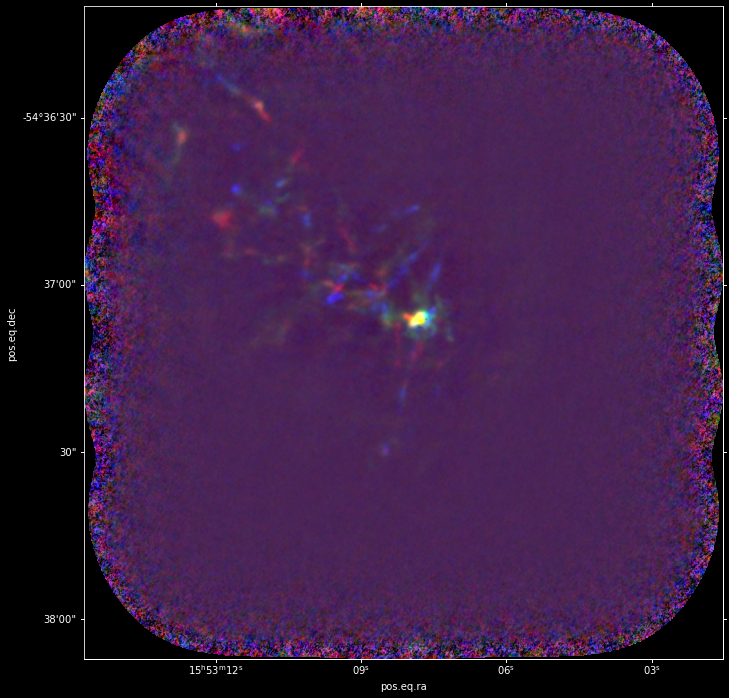

In [8]:
pl.figure(figsize=(12,12))
ax = pl.subplot(111, projection=cube.wcs.celestial)
pl.imshow(im)

In [9]:
%run /orange/adamginsburg/ALMA_IMF/reduction/reduction/imaging_parameters.py

<Figure size 432x288 with 0 Axes>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

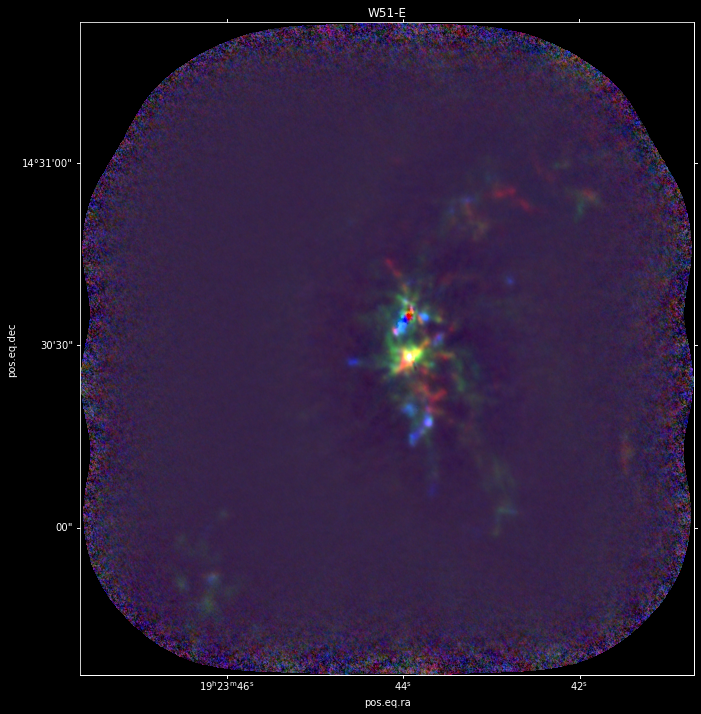

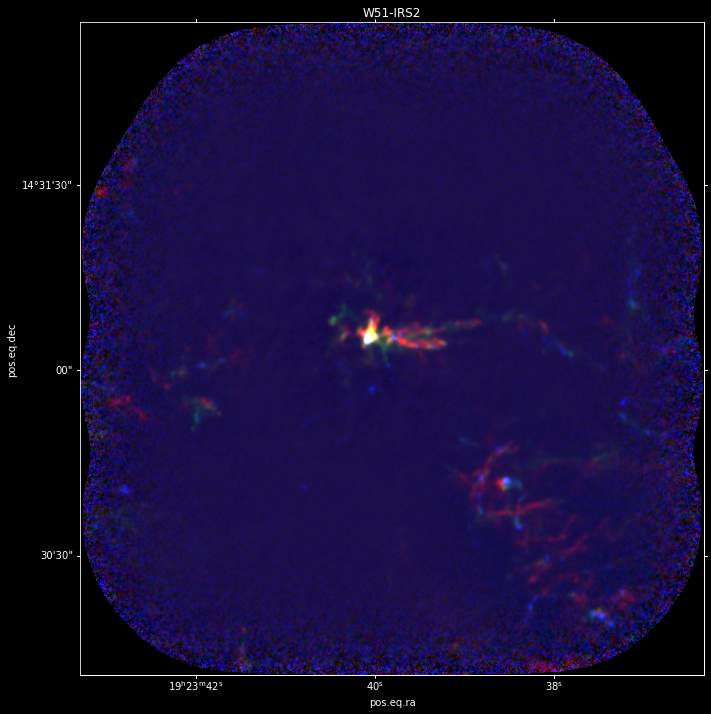

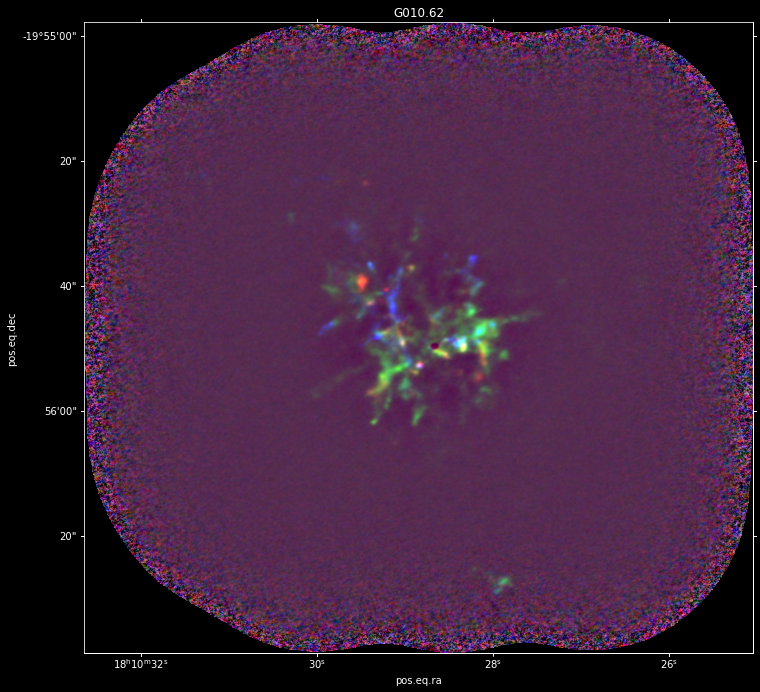

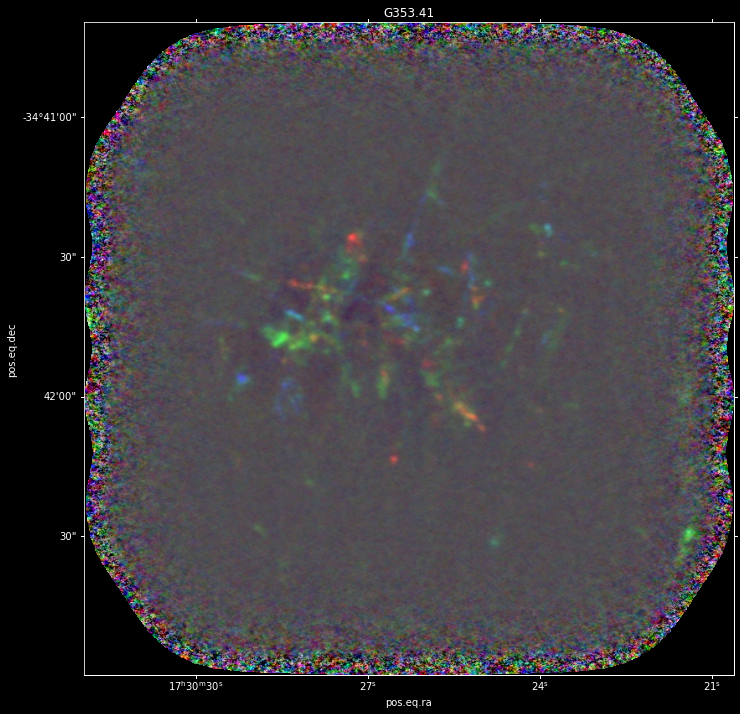

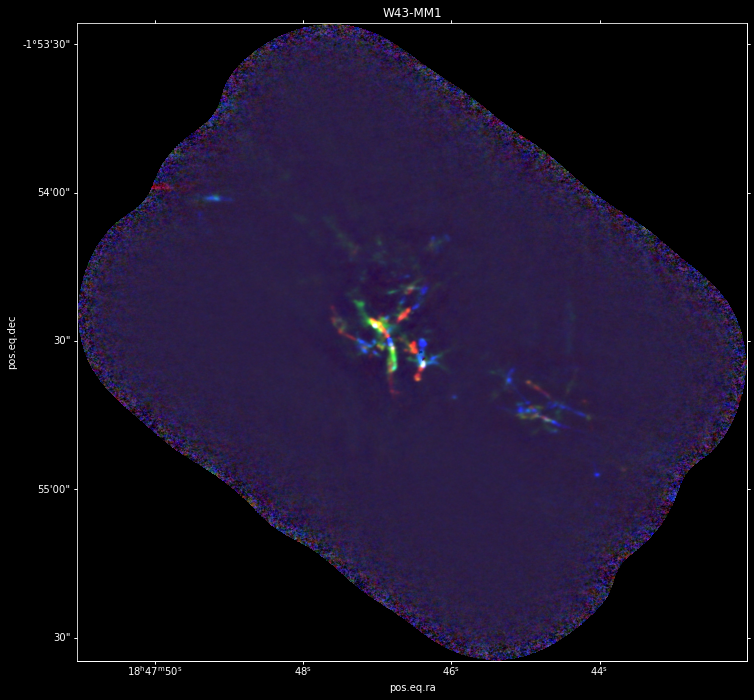

...

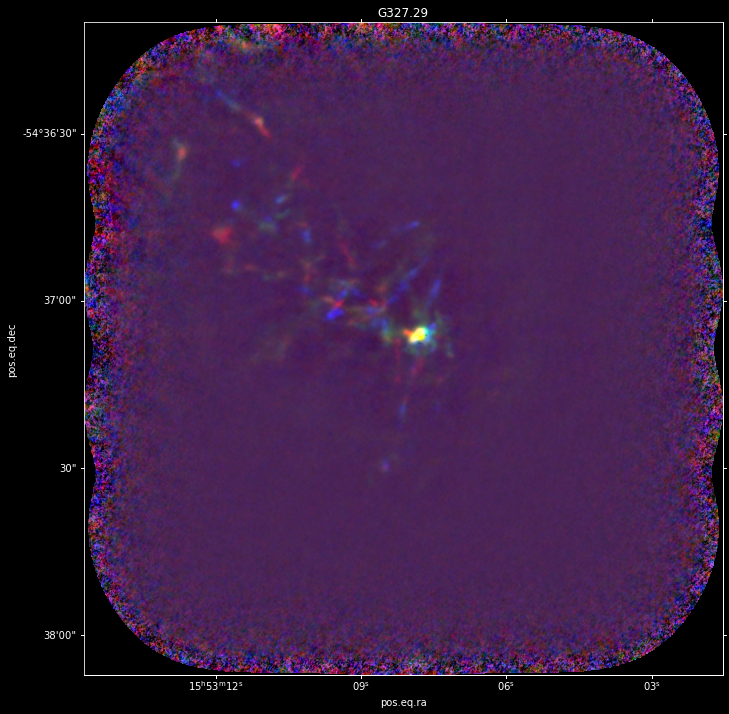

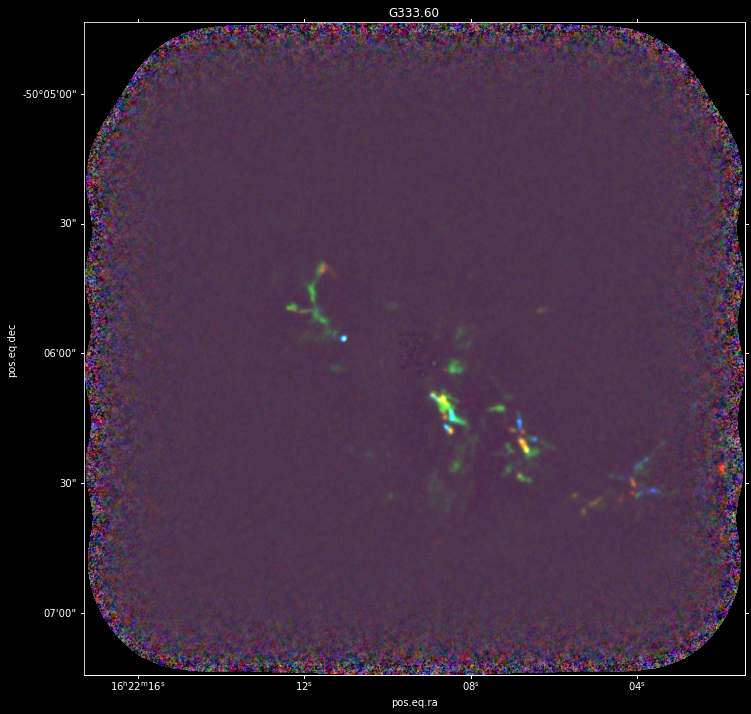

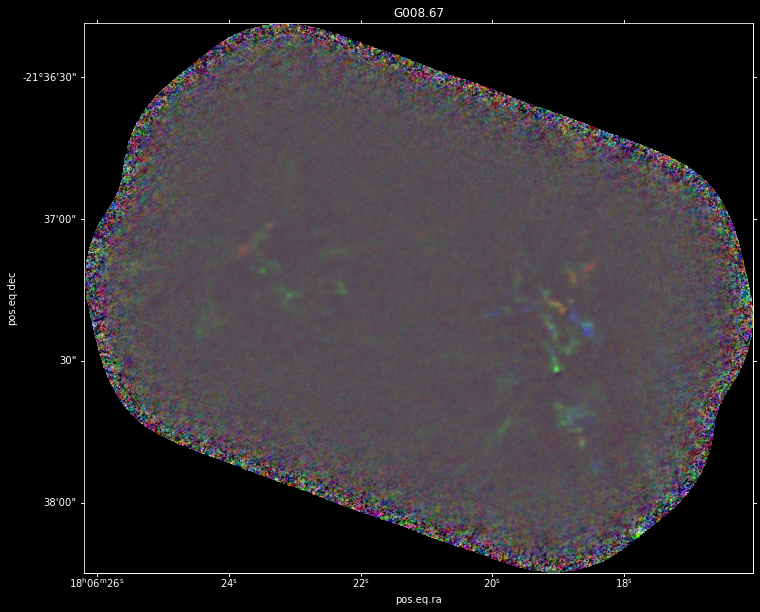

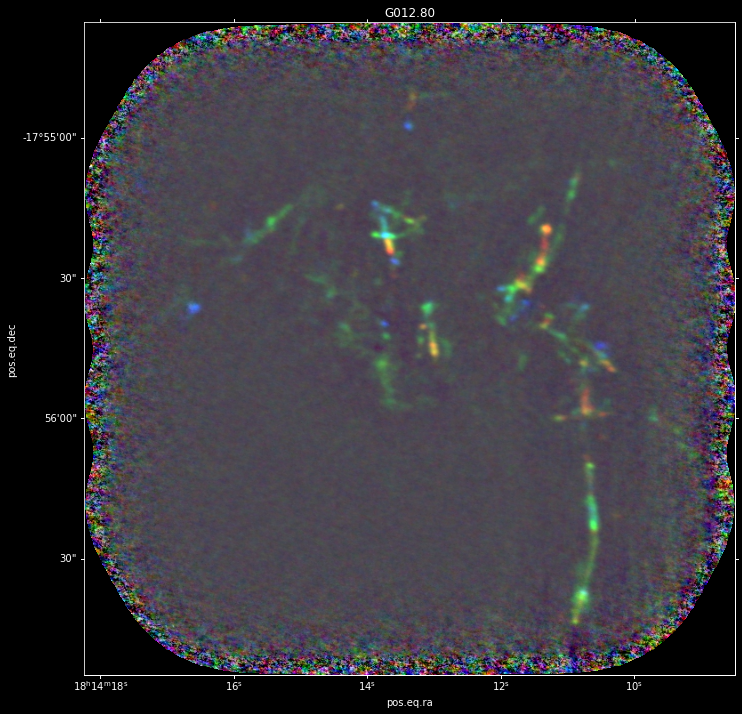

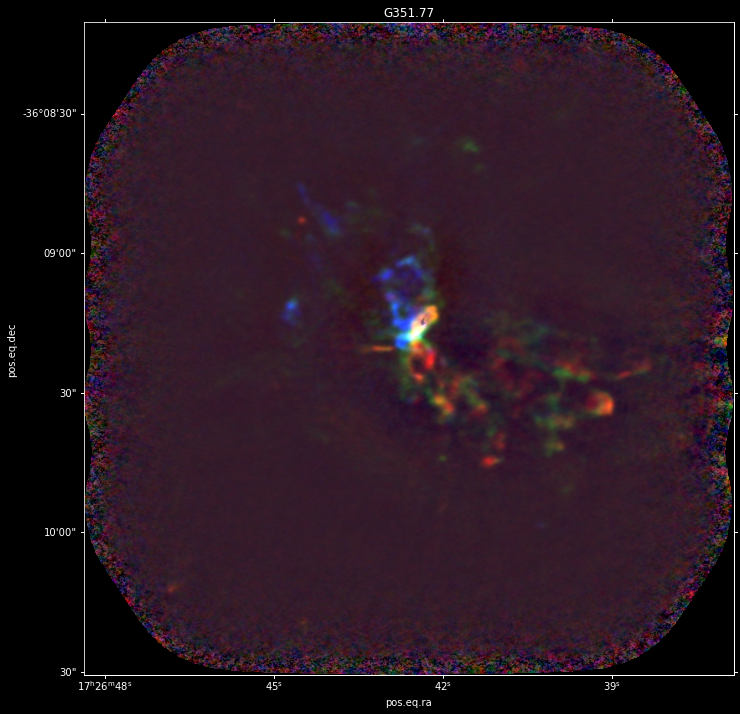

In [12]:
for field in field_vlsr:
    vcen = u.Quantity(field_vlsr[field])
    cube = SpectralCube.read(f'{field}_B6_spw1_12M_sio.JvM.image.pbcor.statcont.contsub.fits').with_spectral_unit(u.km/u.s, velocity_convention='radio', rest_value=217.104984*u.GHz)

    im = make_rgb_moments(cube, 
                      vrange_blue=(vcen-21*u.km/u.s, vcen-7*u.km/u.s),
                      vrange_green=(vcen-7*u.km/u.s, vcen+7*u.km/u.s),
                      vrange_red=(vcen+7*u.km/u.s, vcen+21*u.km/u.s),
                      norm_kwargs_red={'max_percent':99.95, 'min_percent':1},
                      norm_kwargs_green={'max_percent':99.97, 'min_percent':1},
                      norm_kwargs_blue={'max_percent':99.95, 'min_percent':1},
                     )

    pl.figure(figsize=(12,12))
    ax = pl.subplot(111, projection=cube.wcs.celestial)
    pl.imshow(im)
    pl.title(field)